*AI Coursework:* <h5>**CARTOONIFY AN IMAGE WITH DEEP LEARNING**</h5>
<u>Group:</u> 6<br>
<u>Student:</u> Han G. Ha<br>
<u>ID:</u> 001052068<br>
<u>Demo date:</u> 02.12.2020<br>
<u>Notes:</u> Basic solution, <i>no trained code</i>

# **0. Preparation**

In [8]:
# Import libraries
import cv2
import numpy as np
from google.colab.patches import cv2_imshow

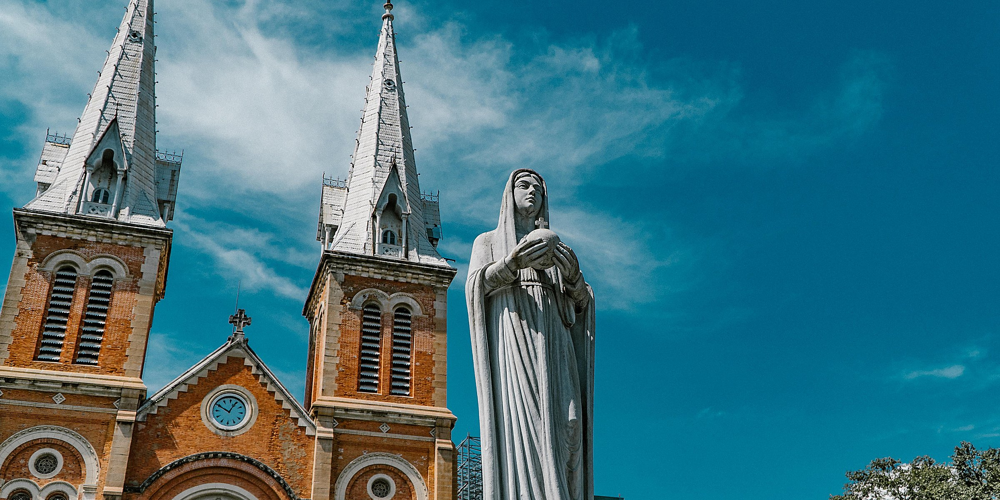

In [9]:
# Import image
img = cv2.imread("/content/cityview__saigonNotreDame1.jfif")
cv2_imshow(img)

# **1. Detect and emphasize edges**

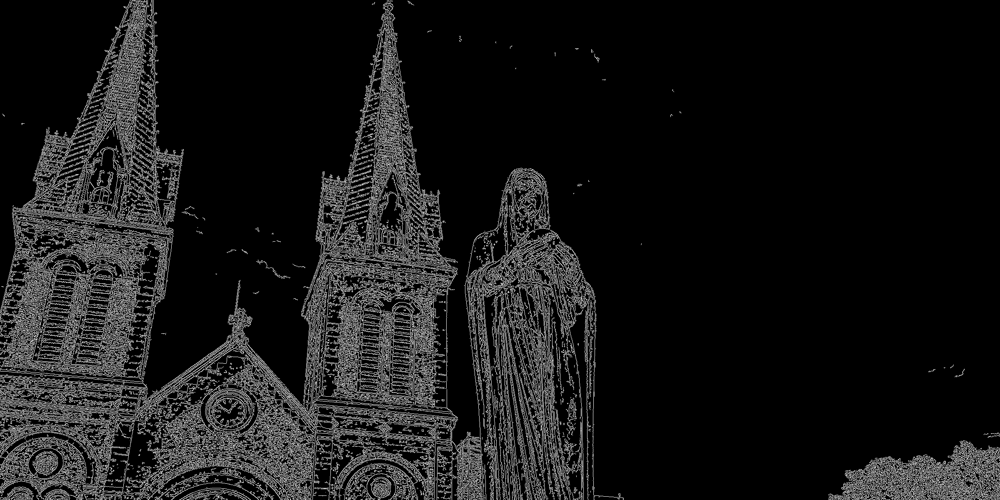

In [10]:
# Detect clear edges with Canny edge detector
# Reduce unneeded details by changing Canny’s input parameters (eg. 100 & 200)
edges = cv2.Canny(img, 100, 200)
cv2_imshow(edges)

In [ ]:
# Convert grayscale to binary image by using a threshold pixel value
# The original pixel value < thresthold value: Assigned to 0
# The original pixel value > thresthold value: Assigned to 255

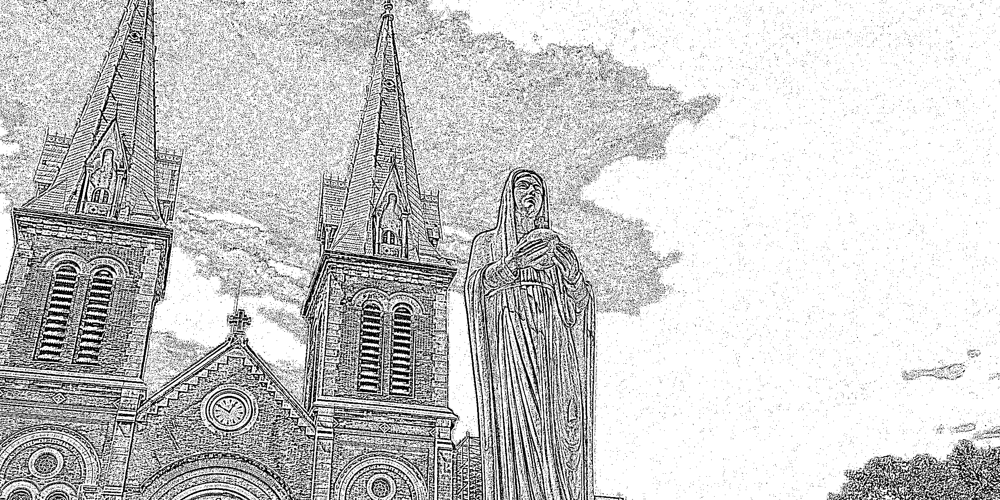

In [11]:
# Method 1: Origin > Grayscale > Threshold
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
edges = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 9, 5)
cv2_imshow(edges)

# **2. Apply filters**



> Indented block



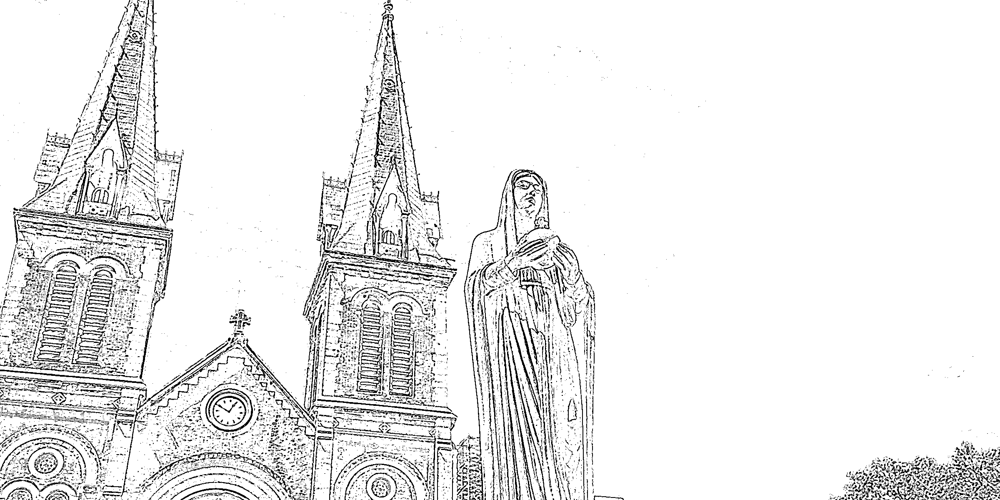

In [12]:
# Method 2: Origin > Grayscale > Median fliter > Threshold
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray_1 = cv2.medianBlur(gray, 5)
edges = cv2.adaptiveThreshold(gray_1, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 5, 5)
cv2_imshow(edges)

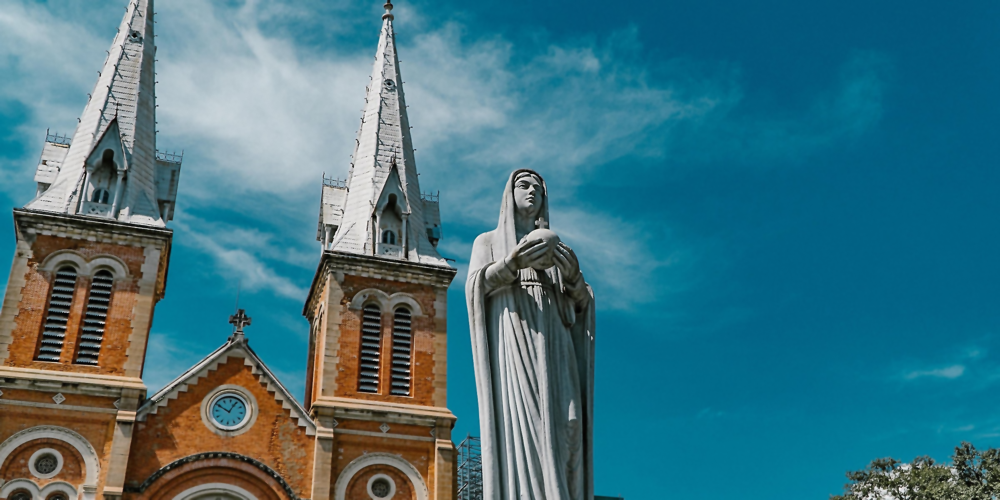

In [13]:
# cv2.medianBlur(): Solid homogeneous but unneeded blur img
# cv2.bilateralFilter(): Smoother img with sharper edges
color = cv2.bilateralFilter(img, d=9, sigmaColor=200,sigmaSpace=200)
cv2_imshow(color)

Parameters in `bilateralFilter()` function:
*   `d` - <br>
*   `sigmaColor` - <br>
*   `sigmaSpace` - <br>


# **3. Cartoonify image**



> Combine `edges` image and `color` image into one sigle image by using c`v2.bitwise_and()` function.



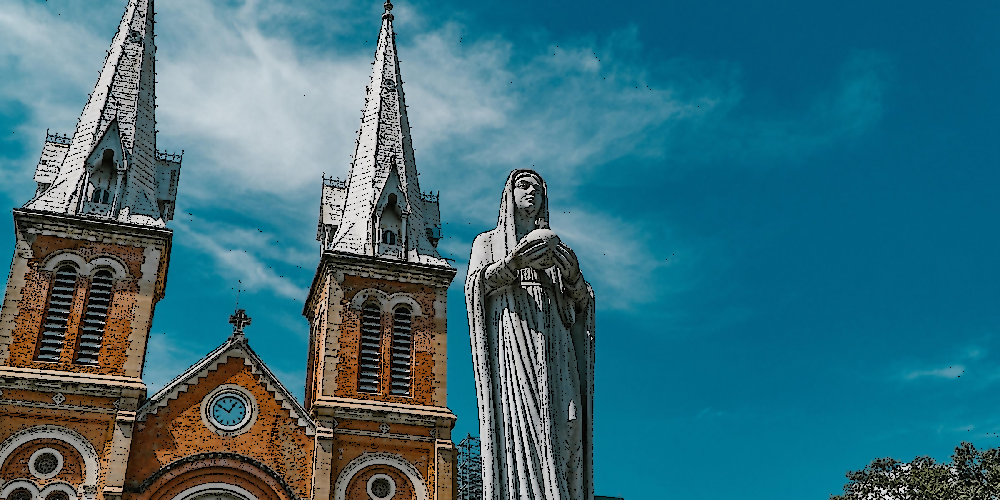

In [14]:
# Mix color and edges 
cartoon = cv2.bitwise_and(color, color, mask=edges)
cv2_imshow(cartoon)



> Limit the number of colors by using K-means clustering



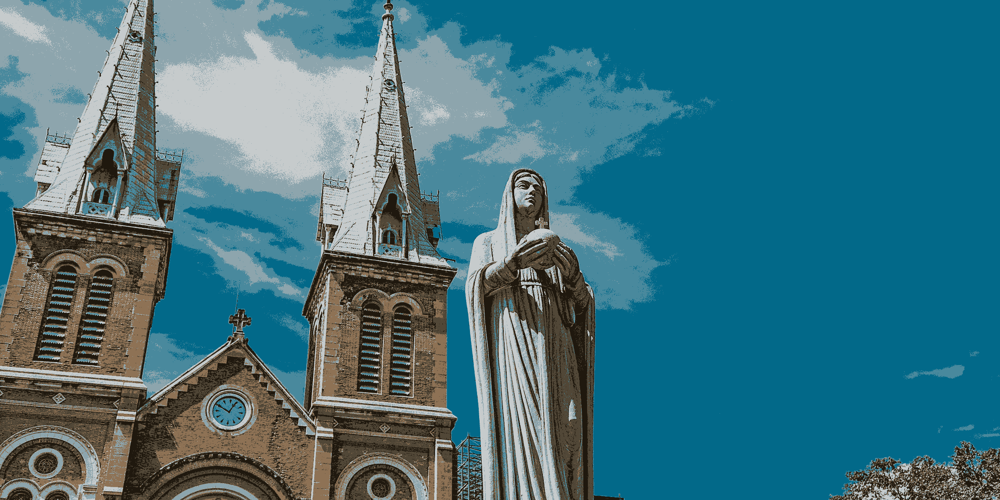

In [15]:
def color_quantization(img, k):
# Defining input data for clustering
  data = np.float32(img).reshape((-1, 3))
# Defining criteria
  criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 20, 1.0)
# Applying cv2.kmeans function
  ret, label, center = cv2.kmeans(data, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
  center = np.uint8(center)
  result = center[label.flatten()]
  result = result.reshape(img.shape)
  return result

img_1 = color_quantization(img, 7)
cv2_imshow(img_1)

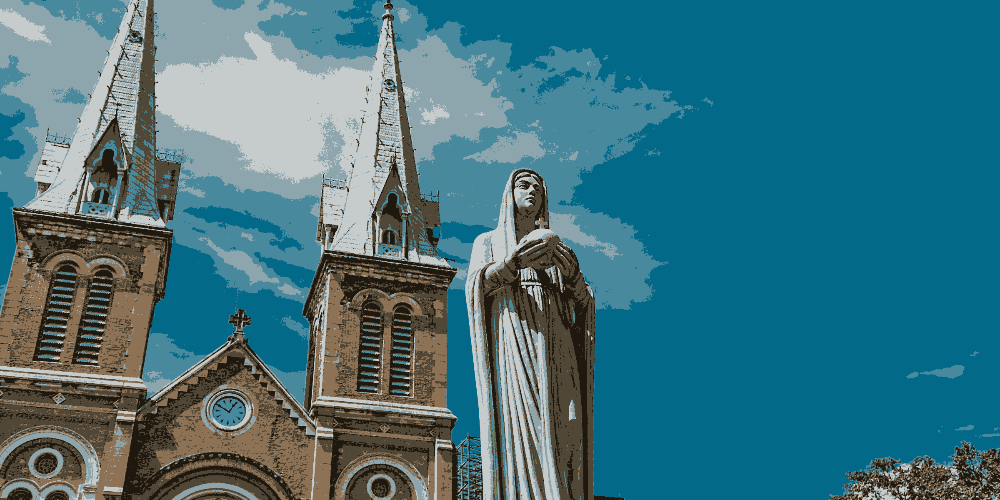

In [16]:
blurred = cv2.medianBlur(img_1, 3)
# change color_1 to img_1
cv2_imshow(blurred)

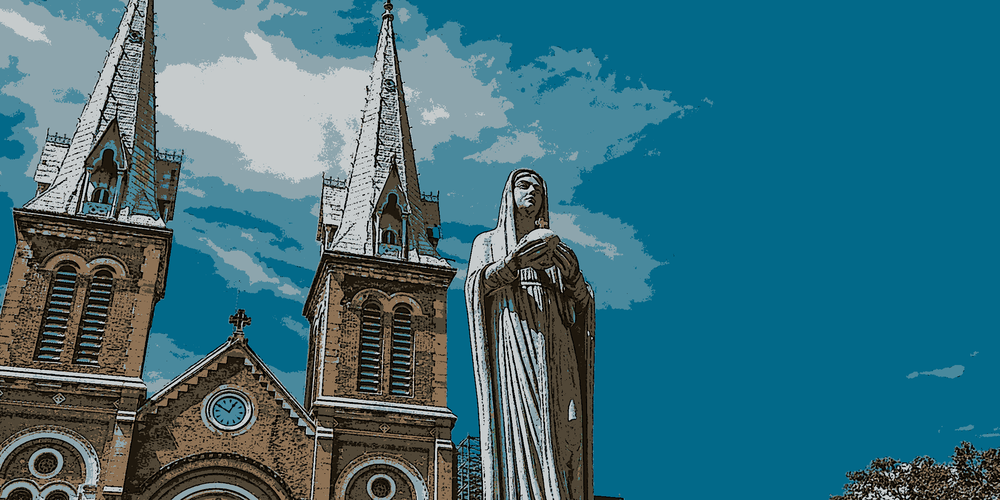

In [17]:
cartoon_1 = cv2.bitwise_and(blurred, blurred, mask=edges)
# Change blured to blurred
cv2_imshow(cartoon_1)